<a href="https://colab.research.google.com/github/stephenkuc/ADS504/blob/main/code%20library/models/DecisionTree%2BEnsembles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Modeling Attrition with Tree-based Methods

### Stephen Kuc and Ryan Dunn

### Connect to data sources and import libraries for modeling

In [ ]:
# Connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install dmba

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 62.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import sqlite3
import csv

from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, roc_auc_score
from sklearn import linear_model, tree, ensemble
import xgboost as xgb
from sklearn.svm import SVC # if we wnated a linear SVM 
from dmba import classificationSummary
from sklearn.metrics import confusion_matrix, precision_score, recall_score

from scipy.stats import uniform, randint

from imblearn.over_sampling import SMOTE

import pydotplus 
from IPython.display import Image
import matplotlib.pyplot as plt

# Turn off warnings for ease of viewing
import warnings
warnings.filterwarnings("ignore")

# Set option to see all columns in output
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',None)

no display found. Using non-interactive Agg backend


## Connecting to SQL database to bring in transformed_data table and non_transformed

In [ ]:
## Transformed Data

# Connect to the database
conn = sqlite3.connect('/content/drive/My Drive/MS-ADS Capstone Project/data/hr_case_study.db')

##### Query general_data table ##### 
# Create cursor object and query table
cursor = conn.cursor()
cursor.execute('SELECT * FROM transformed_data AS d')

# Identify the column names for dataframe
col_names = [desc[0] for desc in cursor.description]

# Fetch all rows from the query and store in dataframe
rows = cursor.fetchall()
transformed_sql= pd.DataFrame(rows, columns = col_names)

# Close the cursor and connection objects
cursor.close()
conn.close()

In [ ]:
transformed_sql.head()

,index,Unnamed: 0,Education,EmployeeID,JobLevel,NumCompaniesWorked,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,time_id,mean_time,median_time,max_time,num_times_over_9hours,num_times_over_11hours,%_under_8,%_over_9,%_over_11,clipped_TrainingTimesLastYear,clipped_NumCompaniesWorked,log_Age,log_StockOptionLevel,log_YearsSinceLastPromotion,log_TotalWorkingYears,log_YearsAtCompany,log_MonthlyIncome,log_PercentSalaryHike,log_DistanceFromHome,log_clipped_YearsWithCurrentManager,log_clipped_num_times_less_8hours,log_total_days,log_num_times_over_9hours,log_num_times_over_11hours,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,Attrition_Yes,Gender_Male,log_AgeBeganWorking,log_WorkingDaysPerYear
0,0,0,0.25,1,1,1.0,0.666667,0.0,0.666667,1.000000,0.333333,1,0 days 07:22:26.896551724,0 days 07:23:00,0 days 07:57:00,0,0,1.0,0.0,0.0,1.00,0.125,0.863147,0.000000,0.00,0.186652,0.186652,0.858755,0.000000,0.462607,0.000000,0.992462,0.847162,0.0,0.0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.858668,0.926953
1,1,1,0.00,2,1,0.0,0.333333,1.0,0.666667,0.333333,1.000000,2,0 days 07:43:03.813559322,0 days 07:43:00,0 days 08:34:00,0,0,1.0,0.0,0.0,0.50,0.000,0.446915,0.301030,0.25,0.482489,0.482489,0.476600,0.896477,0.629511,0.671188,0.959652,0.791635,0.0,0.0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0.305588,0.626674
2,2,2,0.75,3,4,1.0,0.666667,0.0,0.333333,0.333333,0.000000,3,0 days 07:00:48.595041322,0 days 06:59:00,0 days 07:59:00,0,0,1.0,0.0,0.0,0.25,0.125,0.473296,0.602060,0.00,0.482489,0.482489,0.988573,0.372072,0.811368,0.578130,1.000000,0.859920,0.0,0.0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0.337215,0.663684
3,3,3,1.00,4,3,3.0,0.333333,0.0,1.000000,1.000000,0.666667,4,0 days 07:11:36.510638298,0 days 07:11:00,0 days 07:53:00,0,0,1.0,0.0,0.0,1.00,0.375,0.616513,0.602060,0.75,0.591674,0.591674,0.706394,0.000000,0.149726,0.747222,0.994756,0.851046,0.0,0.0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0.425729,0.581211
4,4,4,0.00,5,1,4.0,0.666667,0.0,1.000000,0.000000,0.666667,5,0 days 08:00:22.530612245,0 days 07:58:00,0 days 08:50:00,0,0,1.0,0.0,0.0,0.25,0.500,0.473296,0.477121,0.00,0.524000,0.524000,0.281920,0.103523,0.629511,0.671188,0.884149,0.663853,0.0,0.0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0.305588,0.528216


In [ ]:
cols_to_keep = ['Attrition_Yes','Education','JobLevel','clipped_NumCompaniesWorked','JobInvolvement','PerformanceRating','EnvironmentSatisfaction',
                'JobSatisfaction','WorkLifeBalance','%_over_11','clipped_TrainingTimesLastYear','log_Age','log_StockOptionLevel','log_YearsSinceLastPromotion',
                'log_TotalWorkingYears','log_YearsAtCompany','log_MonthlyIncome','log_PercentSalaryHike','log_DistanceFromHome','log_clipped_YearsWithCurrentManager',
                'BusinessTravel_Travel_Frequently','Department_Research & Development','Department_Sales','JobRole_Manager','JobRole_Sales Representative',
                'EducationField_Technical Degree']

model_df = transformed_sql[cols_to_keep]

model_df.head()

,Attrition_Yes,Education,JobLevel,clipped_NumCompaniesWorked,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,%_over_11,clipped_TrainingTimesLastYear,log_Age,log_StockOptionLevel,log_YearsSinceLastPromotion,log_TotalWorkingYears,log_YearsAtCompany,log_MonthlyIncome,log_PercentSalaryHike,log_DistanceFromHome,log_clipped_YearsWithCurrentManager,BusinessTravel_Travel_Frequently,Department_Research & Development,Department_Sales,JobRole_Manager,JobRole_Sales Representative,EducationField_Technical Degree
0,0,0.25,1,0.125,0.666667,0.0,0.666667,1.000000,0.333333,0.0,1.00,0.863147,0.000000,0.00,0.186652,0.186652,0.858755,0.000000,0.462607,0.000000,0,0,1,0,0,0
1,1,0.00,1,0.000,0.333333,1.0,0.666667,0.333333,1.000000,0.0,0.50,0.446915,0.301030,0.25,0.482489,0.482489,0.476600,0.896477,0.629511,0.671188,1,1,0,0,0,0
2,0,0.75,4,0.125,0.666667,0.0,0.333333,0.333333,0.000000,0.0,0.25,0.473296,0.602060,0.00,0.482489,0.482489,0.988573,0.372072,0.811368,0.578130,1,1,0,0,0,0
3,0,1.00,3,0.375,0.333333,0.0,1.000000,1.000000,0.666667,0.0,1.00,0.616513,0.602060,0.75,0.591674,0.591674,0.706394,0.000000,0.149726,0.747222,0,1,0,0,0,0
4,0,0.00,1,0.500,0.666667,0.0,1.000000,0.000000,0.666667,0.0,0.25,0.473296,0.477121,0.00,0.524000,0.524000,0.281920,0.103523,0.629511,0.671188,0,1,0,0,0,0


In [ ]:
# what is the percentage of minority class (Where attrtion = yes/1)
model_df['Attrition_Yes'].value_counts()[1] / model_df['Attrition_Yes'].value_counts().sum()

0.16122448979591836

## Splitting and Balancing the Data

In [ ]:
# Assign the independent and dependent variables
y = model_df['Attrition_Yes']
X = model_df.drop(columns = ['Attrition_Yes'])

# partitioning data into 90% train and 10% test, and then will further split for validation

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .1, random_state = 12345)

# using 80 / 20 split for train and validation set

X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = .2, random_state = 12345)



In [ ]:
# Balancing data
# Using SMOTE so we don't lose data and synthetically create new data points
# may still result in overfitting to some degree

smote = SMOTE(sampling_strategy='minority',random_state=0)
X_train_smt, y_train_smt = smote.fit_resample(X_train, y_train) # X_smt and y_smt will be used in modeling if concerns around balanced data

y_train_smt.value_counts()

0    2668
1    2668
Name: Attrition_Yes, dtype: int64

In [ ]:
### Modeling Attrition with Tree-based Method

# generating a basic tree with maximum depth of 4

clf = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = 4)

clf = clf.fit(X_train, y_train)

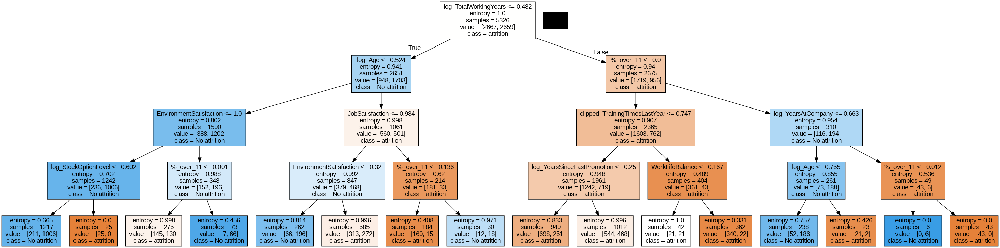

In [ ]:
# installed graphviz & pydotplus
# using to plot the resulting decision tree after training the clasifier

import pydotplus 
from IPython.display import Image

dot_data = tree.export_graphviz(clf, feature_names= X_train.columns, class_names=['attrition','No attrition'], filled=True, 
                                out_file=None) 
graph = pydotplus.graph_from_dot_data(dot_data) 
Image(graph.create_png())



In [ ]:
## testing this on validation set

y_pred = clf.predict(X_valid)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_valid, y_pred)))

Accuracy on validation data is 0.68


In [ ]:
# Getting confusion Matrix

print(classificationSummary(y_valid, y_pred))

Confusion Matrix (Accuracy 0.6824)

       Prediction
Actual   0   1
     0 549 103
     1 320 360
None


In [ ]:
print(classification_report(y_valid, y_pred))

              precision    recall  f1-score   support

           0       0.63      0.84      0.72       652
           1       0.78      0.53      0.63       680

    accuracy                           0.68      1332
   macro avg       0.70      0.69      0.68      1332
weighted avg       0.71      0.68      0.67      1332



## Tuning Decision Tree

In [ ]:
# decision tree

dt_results = []
criterion = ["gini", "entropy", "log_loss"]


for x in criterion:
    for y in range(1,15,1):
        dt = tree.DecisionTreeClassifier(criterion = x, max_depth = y, random_state = 1).fit(X_train, y_train)
        valid_preds = dt.predict(X_valid)
        dt_results.append({'criterion': x, 'max_depth': y,
                           'accuracy': accuracy_score(y_valid, valid_preds), 
                      'precision': precision_score(y_valid, valid_preds),
                           'recall': recall_score(y_valid, valid_preds),
                      'f1_score': f1_score(y_valid, valid_preds)})
    

# Convert results to a pandas data frame
dt_results = pd.DataFrame(dt_results)


In [ ]:
print(dt_results)

   criterion  max_depth  accuracy  precision    recall  f1_score
0       gini          1  0.827456   0.000000  0.000000  0.000000
1       gini          2  0.819899   0.440000  0.160584  0.235294
2       gini          3  0.819899   0.440000  0.160584  0.235294
3       gini          4  0.833753   0.537313  0.262774  0.352941
4       gini          5  0.865239   0.826087  0.277372  0.415301
5       gini          6  0.876574   0.809524  0.372263  0.510000
6       gini          7  0.875315   0.737500  0.430657  0.543779
7       gini          8  0.886650   0.742268  0.525547  0.615385
8       gini          9  0.903023   0.777778  0.613139  0.685714
9       gini         10  0.928212   0.857143  0.700730  0.771084
10      gini         11  0.938287   0.872881  0.751825  0.807843
11      gini         12  0.958438   0.900000  0.854015  0.876404
12      gini         13  0.965995   0.923077  0.875912  0.898876
13      gini         14  0.971033   0.919118  0.912409  0.915751
14   entropy          1  

In [ ]:
# show accuracy by depth
plt.plot(dt_results['max_depth'], dt_results.accuracy, linestyle='-', label = "accuracy")
plt.plot(dt_results['max_depth'], dt_results.recall, linestyle=':', c='red', label = "recall")
plt.plot(dt_results['max_depth'], dt_results['f1_score'], linestyle='--', c='blue', label = "f1 score")
plt.title('Number of estimators vs. metrics \n In validation set for decision tree \n Using Entropy Loss')
plt.legend()
plt.xlabel('Max depth')
plt.ylabel('Metrics score')

plt.show()

(For some reason the above is not displaying.)

It doesn't seem the loss function has an affect on its accuracy. All seem to reach 90%+ accuracy and F1 score around max depth of 10-11.

False negatives are more important to limit in this problem as opposed to false positives; thus, we should try to maximize the recall. 

It seems the best option , with trying not to over-fit, is with entropy at max_depth of 10.

In [ ]:
# training DT with 'optimal' parameters on all data and testing

# partitioning data into 80% train and 20% test

X_train_, X_test_, y_train_, y_test_ = train_test_split(X, y, test_size = .2, random_state = 12345)

In [ ]:
y_train_smt

In [ ]:
# DT

clf = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = 10)

clf = clf.fit(X_train_, y_train_)

## testing this on test set

y_pred_ = clf.predict(X_test_)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_test_, y_pred_)))
# Getting confusion Matrix

print(classificationSummary(y_test_, y_pred_))
print(classification_report(y_test_, y_pred_))

Accuracy on validation data is 0.88
Confusion Matrix (Accuracy 0.8797)

       Prediction
Actual   0   1
     0 653 140
     1  38 649
None
              precision    recall  f1-score   support

           0       0.95      0.82      0.88       793
           1       0.82      0.94      0.88       687

    accuracy                           0.88      1480
   macro avg       0.88      0.88      0.88      1480
weighted avg       0.89      0.88      0.88      1480



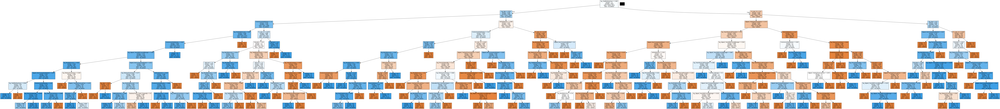

In [ ]:
dot_data = tree.export_graphviz(clf, feature_names= X_train.columns, class_names=['attrition','No attrition'], filled=True, 
                                out_file=None) 
graph = pydotplus.graph_from_dot_data(dot_data) 
Image(graph.create_png())

In [ ]:
# finding feature importance for decision tree

importances = clf.feature_importances_
std = np.std([clf.feature_importances_ for tree in clf.classes_], axis=0)
rf_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
rf_df = rf_df.sort_values('importance', ascending = False)
print(rf_df)

                                feature  importance  std
15                    log_MonthlyIncome    0.104204  0.0
13                log_TotalWorkingYears    0.091703  0.0
10                              log_Age    0.088093  0.0
5               EnvironmentSatisfaction    0.083232  0.0
17                 log_DistanceFromHome    0.081368  0.0
18  log_clipped_YearsWithCurrentManager    0.075052  0.0
12          log_YearsSinceLastPromotion    0.058172  0.0
6                       JobSatisfaction    0.053696  0.0
2            clipped_NumCompaniesWorked    0.051732  0.0
9         clipped_TrainingTimesLastYear    0.050924  0.0
8                             %_over_11    0.049572  0.0
11                 log_StockOptionLevel    0.043071  0.0
16                log_PercentSalaryHike    0.038716  0.0
1                              JobLevel    0.029956  0.0
0                             Education    0.027993  0.0
3                        JobInvolvement    0.022402  0.0
7                       WorkLif

### Modeling Random Forest

In [ ]:
# random forest tuning hyperparameters with Grid Search
# Took very long to tune, lessened parameters; went with entropy as criterion based on DT results

grid_parameters = { 
    'n_estimators': range(200,1001,100),
    'max_depth' : range(4,12,1)}


rf_search = GridSearchCV(ensemble.RandomForestClassifier(random_state=1234, criterion = 'entropy', max_features = 'sqrt'), grid_parameters, cv= 5)
rf_search = rf_search.fit(X_train_smt, y_train_smt)

# saving best parameters
rf_clf = rf_search.best_estimator_ 

In [ ]:
rf_clf

RandomForestClassifier(criterion='entropy', max_depth=11, n_estimators=300,
                       random_state=1234)

Per the validation, the 'optimal' parameters seem to be max_depth = 11 and n_estimators = 300.

In [ ]:
rf = ensemble.RandomForestClassifier(n_estimators = 300, max_depth = 11, random_state = 1234).fit(X_train_smt, y_train_smt)

## testing this on test set

y_pred_rf = rf.predict(X_valid)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_valid, y_pred_rf)))
# Getting confusion Matrix

print(classificationSummary(y_valid, y_pred_rf))
print(classification_report(y_valid, y_pred_rf))

Accuracy on validation data is 0.97
Confusion Matrix (Accuracy 0.9685)

       Prediction
Actual   0   1
     0 645  12
     1  13 124
None
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       657
           1       0.91      0.91      0.91       137

    accuracy                           0.97       794
   macro avg       0.95      0.94      0.94       794
weighted avg       0.97      0.97      0.97       794



In [ ]:
# trying with a different max_depth

rf = ensemble.RandomForestClassifier(n_estimators = 300, max_depth = 8, random_state = 1234).fit(X_train_smt, y_train_smt)

## testing this on test set

y_pred_rf = rf.predict(X_valid)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_valid, y_pred_rf)))
# Getting confusion Matrix

print(classificationSummary(y_valid, y_pred_rf))
print(classification_report(y_valid, y_pred_rf))

Accuracy on validation data is 0.90
Confusion Matrix (Accuracy 0.9018)

       Prediction
Actual   0   1
     0 622  35
     1  43  94
None
              precision    recall  f1-score   support

           0       0.94      0.95      0.94       657
           1       0.73      0.69      0.71       137

    accuracy                           0.90       794
   macro avg       0.83      0.82      0.82       794
weighted avg       0.90      0.90      0.90       794



These numbers seem to point to overfitting; let's take a closer look at areas like the gridsearch results and feature importance

In [ ]:
# variable (feature) importance plot
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
rf_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
rf_df = rf_df.sort_values('importance', ascending = False)
print(rf_df)


fig = plt.figure()
fig.set_figwidth(10)
fig.set_figheight(25)

ax = rf_df.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('Feature')
plt.show()

                                feature  importance       std
10                              log_Age    0.092079  0.026042
14                   log_YearsAtCompany    0.084826  0.053799
13                log_TotalWorkingYears    0.081827  0.054251
18  log_clipped_YearsWithCurrentManager    0.071845  0.044593
5               EnvironmentSatisfaction    0.056544  0.023805
15                    log_MonthlyIncome    0.055371  0.016721
6                       JobSatisfaction    0.055035  0.026821
17                 log_DistanceFromHome    0.051800  0.016078
12          log_YearsSinceLastPromotion    0.051287  0.023750
2            clipped_NumCompaniesWorked    0.051258  0.018939
9         clipped_TrainingTimesLastYear    0.050558  0.022087
16                log_PercentSalaryHike    0.042206  0.013703
0                             Education    0.035717  0.017789
11                 log_StockOptionLevel    0.035552  0.019455
3                        JobInvolvement    0.035214  0.017778
8       

In [ ]:
model_df[['log_Age', 'log_YearsAtCompany', 'log_TotalWorkingYears', 'log_clipped_YearsWithCurrentManager', 'JobSatisfaction', 'EnvironmentSatisfaction', 'Attrition_Yes']].corr()

,log_Age,log_YearsAtCompany,log_TotalWorkingYears,log_clipped_YearsWithCurrentManager,JobSatisfaction,EnvironmentSatisfaction,Attrition_Yes
log_Age,1.000000,0.297130,0.297111,0.196486,-0.004266,0.009496,-0.180242
log_YearsAtCompany,0.297130,1.000000,0.999997,0.821163,0.008358,0.007106,-0.198467
log_TotalWorkingYears,0.297111,0.999997,1.000000,0.821145,0.008344,0.007088,-0.198449
log_clipped_YearsWithCurrentManager,0.196486,0.821163,0.821145,1.000000,-0.012252,0.001693,-0.190233
JobSatisfaction,-0.004266,0.008358,0.008344,-0.012252,1.000000,-0.005403,-0.102917
EnvironmentSatisfaction,0.009496,0.007106,0.007088,0.001693,-0.005403,1.000000,-0.101761
Attrition_Yes,-0.180242,-0.198467,-0.198449,-0.190233,-0.102917,-0.101761,1.000000


There is some multi-collinearity between features near the top, all having to do with age or time at the company, and this supports that there may have been overfitting.

There is an opportunity to itereate each of these, with considerably less features for each, as well as trying with different data balancing techniques to limit overfitting concerns.

## Feature Selection and Model Iteration/Re train

In [ ]:
model_df.columns

Index(['Attrition_Yes', 'Education', 'JobLevel', 'clipped_NumCompaniesWorked',
       'JobInvolvement', 'PerformanceRating', 'EnvironmentSatisfaction',
       'JobSatisfaction', 'WorkLifeBalance', '%_over_11',
       'clipped_TrainingTimesLastYear', 'log_Age', 'log_StockOptionLevel',
       'log_YearsSinceLastPromotion', 'log_TotalWorkingYears',
       'log_YearsAtCompany', 'log_MonthlyIncome', 'log_PercentSalaryHike',
       'log_DistanceFromHome', 'log_clipped_YearsWithCurrentManager',
       'BusinessTravel_Travel_Frequently', 'Department_Research & Development',
       'Department_Sales', 'JobRole_Manager', 'JobRole_Sales Representative',
       'EducationField_Technical Degree', 'MaritalStatus_Single',
       'WorkLifeBalance'],
      dtype='object')

In [ ]:
## Getting rid of features w/ high multi-collinearity and low importance in both DT and RF

cols_drop = ['log_YearsAtCompany', 'log_TotalWorkingYears', 'JobRole_Sales Representative', 'PerformanceRating', 'JobRole_Manager', 'Department_Research & Development']

model_df_small = model_df.drop(cols_drop, axis = 1)



In [ ]:
# Assign the independent and dependent variables
y_s = model_df_small['Attrition_Yes']
X_s = model_df_small.drop(columns = ['Attrition_Yes'])


# partitioning data into 90% train and 10% test, and then will further split for validation


X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X_s, y_s, test_size = .1, random_state = 12345)


# using 80 / 20 split for train and validation set


X_train_s, X_valid_s, y_train_s, y_valid_s = train_test_split(X_train_s, y_train_s, test_size = .2, random_state = 12345)


In [ ]:
# Balancing data
# Using SMOTE so we don't lose data and synthetically create new data points
# may still result in overfitting to some degree


smote = SMOTE(sampling_strategy='minority',random_state=0)
X_train_smt_s, y_train_smt_s = smote.fit_resample(X_train_s, y_train_s) # X_smt and y_smt will be used in modeling if concerns around balanced data


y_train_smt_s.value_counts()

0    2668
1    2668
Name: Attrition_Yes, dtype: int64

In [ ]:
# decision tree

dt_results = []

for y in range(1,20,1):
        dt = tree.DecisionTreeClassifier(criterion = "entropy", max_depth = y, random_state = 1).fit(X_train_smt_s, y_train_smt_s)
        valid_preds = dt.predict(X_valid_s)
        dt_results.append({'criterion': "entropy", 'max_depth': y,
                           'accuracy': accuracy_score(y_valid_s, valid_preds), 
                      'precision': precision_score(y_valid_s, valid_preds),
                           'recall': recall_score(y_valid_s, valid_preds),
                      'f1_score': f1_score(y_valid_s, valid_preds)})
    

# Convert results to a pandas data frame
dt_results_small = pd.DataFrame(dt_results)

In [ ]:
print(dt_results_small)

   criterion  max_depth  accuracy  precision    recall  f1_score
0    entropy          1  0.714106   0.260638  0.357664  0.301538
1    entropy          2  0.714106   0.260638  0.357664  0.301538
2    entropy          3  0.765743   0.323741  0.328467  0.326087
3    entropy          4  0.782116   0.354839  0.321168  0.337165
4    entropy          5  0.724181   0.321739  0.540146  0.403270
5    entropy          6  0.764484   0.393162  0.671533  0.495957
6    entropy          7  0.826196   0.497110  0.627737  0.554839
7    entropy          8  0.836272   0.522293  0.598540  0.557823
8    entropy          9  0.867758   0.596386  0.722628  0.653465
9    entropy         10  0.879093   0.639456  0.686131  0.661972
10   entropy         11  0.866499   0.582888  0.795620  0.672840
11   entropy         12  0.901763   0.672515  0.839416  0.746753
12   entropy         13  0.900504   0.652632  0.905109  0.758410
13   entropy         14  0.916877   0.693989  0.927007  0.793750
14   entropy         15  

In [ ]:
# using max_depth of 8, we'll re-train this

dt = tree.DecisionTreeClassifier(criterion = "entropy", max_depth = 8, random_state = 1).fit(X_train_smt_s, y_train_smt_s)

# and use on test set

y_preds = dt.predict(X_test_s)

print('accuracy: ', accuracy_score(y_test_s, y_preds), 
                      'precision: ', precision_score(y_test_s, y_preds),
                           'recall: ', recall_score(y_test_s, y_preds),
                      'f1_score: ', f1_score(y_test_s, y_preds))

accuracy:  0.8231292517006803 precision:  0.4421052631578947 recall:  0.6268656716417911 f1_score:  0.5185185185185185


In [ ]:
print(classificationSummary(y_test_s, y_preds))
print(classification_report(y_test_s, y_preds))

Confusion Matrix (Accuracy 0.8231)

       Prediction
Actual   0   1
     0 321  53
     1  25  42
None
              precision    recall  f1-score   support

           0       0.93      0.86      0.89       374
           1       0.44      0.63      0.52        67

    accuracy                           0.82       441
   macro avg       0.68      0.74      0.71       441
weighted avg       0.85      0.82      0.83       441



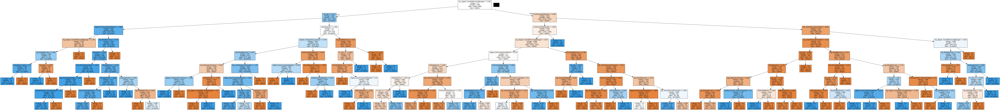

In [ ]:
dot_data = tree.export_graphviz(dt, feature_names= X_train_smt_s.columns, class_names=['attrition','No attrition'], filled=True, 
                                out_file=None) 
graph = pydotplus.graph_from_dot_data(dot_data) 
Image(graph.create_png())

In [ ]:
# finding feature importance for decision tree

importances = dt.feature_importances_
std = np.std([dt.feature_importances_ for tree in dt.classes_], axis=0)
dt_df = pd.DataFrame({'feature': X_train_smt_s.columns, 'importance': importances, 'std': std})
dt_df = dt_df.sort_values('importance', ascending = False)
print(dt_df)

                                feature  importance  std
15  log_clipped_YearsWithCurrentManager    0.172767  0.0
4               EnvironmentSatisfaction    0.138332  0.0
12                    log_MonthlyIncome    0.116318  0.0
11          log_YearsSinceLastPromotion    0.102814  0.0
5                       JobSatisfaction    0.091125  0.0
9                               log_Age    0.089631  0.0
2            clipped_NumCompaniesWorked    0.070794  0.0
7                             %_over_11    0.034443  0.0
8         clipped_TrainingTimesLastYear    0.034232  0.0
14                 log_DistanceFromHome    0.031565  0.0
3                        JobInvolvement    0.028841  0.0
13                log_PercentSalaryHike    0.023723  0.0
0                             Education    0.014113  0.0
1                              JobLevel    0.011934  0.0
6                       WorkLifeBalance    0.011464  0.0
16     BusinessTravel_Travel_Frequently    0.010825  0.0
18      EducationField_Technica

## Random Forest

In [ ]:
# since we're doing cross-validation, we can utilize a larger training set 

# partitioning data into 80% train and 20% test

X_train_, X_test_, y_train_, y_test_ = train_test_split(X_s, y_s, test_size = .2, random_state = 12345)

In [ ]:
smote = SMOTE(sampling_strategy='minority',random_state=0)
X_train_smt_s_, y_train_smt_s_ = smote.fit_resample(X_train_, y_train_) # X_train_smt_s_ and y_train_smt_s_ will be used in final modeling if concerns around balanced data

In [ ]:
## Random Forest again

grid_parameters = { 
    'n_estimators': range(200,1001,100),
    'max_depth' : range(4,12,1)}


rf_search = GridSearchCV(ensemble.RandomForestClassifier(random_state=1234, criterion = 'entropy', max_features = 'sqrt'), grid_parameters, cv= 5)
rf_search = rf_search.fit(X_train_smt_s_, y_train_smt_s_)

# saving best parameters
rf_clf_s = rf_search.best_estimator_ 

In [ ]:
rf_clf_s

RandomForestClassifier(criterion='entropy', max_depth=11, n_estimators=500,
                       random_state=1234)

"optimal" model with 500 estimators and max_depth of 11

In [ ]:
rf_s = ensemble.RandomForestClassifier(n_estimators = 600, max_depth = 11, random_state = 1234).fit(X_train_smt_s, y_train_smt_s)

## testing this on test set

y_pred_rf_s = rf_s.predict(X_valid_s)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_valid_s, y_pred_rf_s)))
# Getting confusion Matrix

print(classificationSummary(y_valid_s, y_pred_rf_s))
print(classification_report(y_valid_s, y_pred_rf_s))

Accuracy on validation data is 0.96
Confusion Matrix (Accuracy 0.9610)

       Prediction
Actual   0   1
     0 643  14
     1  17 120
None
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       657
           1       0.90      0.88      0.89       137

    accuracy                           0.96       794
   macro avg       0.93      0.93      0.93       794
weighted avg       0.96      0.96      0.96       794



In [ ]:
# feature importance 
importances = rf_s.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf_s.estimators_], axis=0)
rf_df_s = pd.DataFrame({'feature': X_train_smt_s.columns, 'importance': importances, 'std': std})
rf_df_s = rf_df_s.sort_values('importance', ascending = False)
print(rf_df_s)

                                feature  importance       std
15  log_clipped_YearsWithCurrentManager    0.129040  0.036162
9                               log_Age    0.118107  0.030022
4               EnvironmentSatisfaction    0.079031  0.028776
2            clipped_NumCompaniesWorked    0.068992  0.024067
12                    log_MonthlyIncome    0.066700  0.018125
11          log_YearsSinceLastPromotion    0.060730  0.026854
14                 log_DistanceFromHome    0.060201  0.018765
8         clipped_TrainingTimesLastYear    0.059230  0.024463
5                       JobSatisfaction    0.058792  0.027235
13                log_PercentSalaryHike    0.054667  0.017440
7                             %_over_11    0.045299  0.020869
0                             Education    0.041796  0.019448
10                 log_StockOptionLevel    0.035625  0.019131
6                       WorkLifeBalance    0.032421  0.015003
3                        JobInvolvement    0.030553  0.014123
1       

In [ ]:
# how accurate could it be with less depth? 

rf_s = ensemble.RandomForestClassifier(n_estimators = 600, max_depth = 8, random_state = 1234).fit(X_train_smt_s, y_train_smt_s)

## testing this on test set

y_pred_rf_s = rf_s.predict(X_valid_s)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_valid_s, y_pred_rf_s)))
# Getting confusion Matrix

print(classificationSummary(y_valid_s, y_pred_rf_s))
print(classification_report(y_valid_s, y_pred_rf_s))

Accuracy on validation data is 0.91
Confusion Matrix (Accuracy 0.9081)

       Prediction
Actual   0   1
     0 622  35
     1  38  99
None
              precision    recall  f1-score   support

           0       0.94      0.95      0.94       657
           1       0.74      0.72      0.73       137

    accuracy                           0.91       794
   macro avg       0.84      0.83      0.84       794
weighted avg       0.91      0.91      0.91       794



In [ ]:
## Final RF model - with depth of 11
## training on larger training set

rf_s = ensemble.RandomForestClassifier(n_estimators = 600, max_depth = 11, random_state = 1234).fit(X_train_smt_s_, y_train_smt_s_)

## testing this on test set

y_pred_rf_s = rf_s.predict(X_test_)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_test_, y_pred_rf_s)))
# Getting confusion Matrix

print(classificationSummary(y_test_, y_pred_rf_s))
print(classification_report(y_test_, y_pred_rf_s))

Accuracy on validation data is 0.98
Confusion Matrix (Accuracy 0.9762)

       Prediction
Actual   0   1
     0 752   2
     1  19 109
None
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       754
           1       0.98      0.85      0.91       128

    accuracy                           0.98       882
   macro avg       0.98      0.92      0.95       882
weighted avg       0.98      0.98      0.98       882



In [ ]:
# feature importance 
importances = rf_s.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf_s.estimators_], axis=0)
rf_df_s = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
rf_df_s = rf_df_s.sort_values('importance', ascending = False)
print(rf_df_s)

                                feature  importance       std
9                               log_Age    0.112422  0.026547
15  log_clipped_YearsWithCurrentManager    0.106318  0.029563
5                       JobSatisfaction    0.079406  0.030666
12                    log_MonthlyIncome    0.065842  0.017020
4               EnvironmentSatisfaction    0.065387  0.024588
2            clipped_NumCompaniesWorked    0.064245  0.021209
14                 log_DistanceFromHome    0.059347  0.016864
13                log_PercentSalaryHike    0.057410  0.017709
8         clipped_TrainingTimesLastYear    0.053897  0.018973
11          log_YearsSinceLastPromotion    0.049479  0.021375
6                       WorkLifeBalance    0.044785  0.021872
3                        JobInvolvement    0.041380  0.020709
7                             %_over_11    0.037770  0.018191
19                 MaritalStatus_Single    0.037182  0.014408
0                             Education    0.035613  0.014132
10      

In [ ]:
## Final RF model
## training on larger training set

rf_s = ensemble.RandomForestClassifier(n_estimators = 600, max_depth = 8, random_state = 1234).fit(X_train_smt_s_, y_train_smt_s_)

## testing this on test set

y_pred_rf_s = rf_s.predict(X_test_)

print('Accuracy on validation data is %.2f' % (accuracy_score(y_test_, y_pred_rf_s)))
# Getting confusion Matrix

print(classificationSummary(y_test_, y_pred_rf_s))
print(classification_report(y_test_, y_pred_rf_s))

Accuracy on validation data is 0.93
Confusion Matrix (Accuracy 0.9308)

       Prediction
Actual   0   1
     0 728  26
     1  35  93
None
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       754
           1       0.78      0.73      0.75       128

    accuracy                           0.93       882
   macro avg       0.87      0.85      0.86       882
weighted avg       0.93      0.93      0.93       882



In [ ]:
# feature importance 
importances = rf_s.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf_s.estimators_], axis=0)
rf_df_s = pd.DataFrame({'feature': X_train_smt_s_.columns, 'importance': importances, 'std': std})
rf_df_s = rf_df_s.sort_values('importance', ascending = False)
print(rf_df_s)

                                feature  importance       std
9                               log_Age    0.132739  0.037573
15  log_clipped_YearsWithCurrentManager    0.131169  0.048085
5                       JobSatisfaction    0.086452  0.044602
4               EnvironmentSatisfaction    0.080983  0.040863
2            clipped_NumCompaniesWorked    0.063000  0.029942
12                    log_MonthlyIncome    0.057541  0.022685
11          log_YearsSinceLastPromotion    0.055950  0.037850
8         clipped_TrainingTimesLastYear    0.054544  0.030099
7                             %_over_11    0.052582  0.030614
14                 log_DistanceFromHome    0.052460  0.024066
13                log_PercentSalaryHike    0.048075  0.023211
6                       WorkLifeBalance    0.043870  0.031309
0                             Education    0.033741  0.023693
3                        JobInvolvement    0.031001  0.022243
10                 log_StockOptionLevel    0.030990  0.023855
1       

## Testing on imbalanced data

For a sanity check, how would this RF look if trained with the original, imbalanced data?

In [ ]:
rf_imb = ensemble.RandomForestClassifier(n_estimators = 600, max_depth = 11, random_state = 1234).fit(X_train_, y_train_)

## testing this on validation set

y_pred_rf_imb = rf_imb.predict(X_test_)

print('Accuracy on test data is %.2f' % (accuracy_score(y_test_, y_pred_rf_imb)))
# Getting confusion Matrix

print(classificationSummary(y_test_, y_pred_rf_imb))
print(classification_report(y_test_, y_pred_rf_imb))

Accuracy on validation data is 0.96
Confusion Matrix (Accuracy 0.9592)

       Prediction
Actual   0   1
     0 754   0
     1  36  92
None
              precision    recall  f1-score   support

           0       0.95      1.00      0.98       754
           1       1.00      0.72      0.84       128

    accuracy                           0.96       882
   macro avg       0.98      0.86      0.91       882
weighted avg       0.96      0.96      0.96       882



### Ada Boost with Decision Tree

In [ ]:
ada_results = []

for x in range(200, 800, 100):
    ada = ensemble.AdaBoostClassifier(tree.DecisionTreeClassifier(criterion = "entropy", max_depth = 11, random_state = 1), n_estimators = x)
    ada.fit(X_train_smt_s, y_train_smt_s)
    valid_preds = ada.predict(X_valid_s)
    ada_results.append({'criterion': "entropy", 'max_depth': 11, 'n_estimators': x,
                           'accuracy': accuracy_score(y_valid_s, valid_preds), 
                      'precision': precision_score(y_valid_s, valid_preds),
                           'recall': recall_score(y_valid_s, valid_preds),
                      'f1_score': f1_score(y_valid_s, valid_preds)})
    

# Convert results to a pandas data frame
ada_results = pd.DataFrame(ada_results)

In [ ]:
ada_results

,criterion,max_depth,n_estimators,accuracy,precision,recall,f1_score
0,entropy,11,200,0.988665,0.977612,0.956204,0.966790
1,entropy,11,300,0.992443,1.000000,0.956204,0.977612
2,entropy,11,400,0.988665,0.977612,0.956204,0.966790
3,entropy,11,500,0.988665,0.977612,0.956204,0.966790
4,entropy,11,600,0.988665,0.977612,0.956204,0.966790
5,entropy,11,700,0.988665,0.977612,0.956204,0.966790


In [ ]:
ada_results_2 = []

for x in range(200, 800, 100):
  for y in range(6, 12, 2):
    ada = ensemble.AdaBoostClassifier(tree.DecisionTreeClassifier(criterion = "entropy", max_depth = y, random_state = 1), n_estimators = x)
    ada.fit(X_train_smt_s, y_train_smt_s)
    valid_preds = ada.predict(X_valid_s)
    ada_results_2.append({'criterion': "entropy", 'max_depth': y, 'n_estimators': x,
                           'accuracy': accuracy_score(y_valid_s, valid_preds), 
                      'precision': precision_score(y_valid_s, valid_preds),
                           'recall': recall_score(y_valid_s, valid_preds),
                      'f1_score': f1_score(y_valid_s, valid_preds)})
    

# Convert results to a pandas data frame
ada_results_2 = pd.DataFrame(ada_results_2)

In [ ]:
ada_results_2

,criterion,max_depth,n_estimators,accuracy,precision,recall,f1_score
0,entropy,6,200,0.986146,0.963235,0.956204,0.959707
1,entropy,8,200,0.988665,0.977612,0.956204,0.966790
2,entropy,10,200,0.989924,0.984962,0.956204,0.970370
3,entropy,6,300,0.991184,0.977941,0.970803,0.974359
4,entropy,8,300,0.991184,0.977941,0.970803,0.974359
5,entropy,10,300,0.992443,1.000000,0.956204,0.977612
6,entropy,6,400,0.986146,0.963235,0.956204,0.959707
7,entropy,8,400,0.988665,0.977612,0.956204,0.966790
8,entropy,10,400,0.988665,0.977612,0.956204,0.966790
9,entropy,6,500,0.986146,0.963235,0.956204,0.959707


In [ ]:
# we want to maximize recall, so let's utilize n_estimators = 200, and max_depth = 10.

ada = ensemble.AdaBoostClassifier(tree.DecisionTreeClassifier(criterion = "entropy", max_depth = 10, random_state = 1), n_estimators = 200)

ada.fit(X_train_smt_s_, y_train_smt_s_)

AdaBoostClassifier(estimator=DecisionTreeClassifier(criterion='entropy',
                                                    max_depth=10,
                                                    random_state=1),
                   n_estimators=200)

In [ ]:
# testing on test set

y_pred_ada = ada.predict(X_test_)

# Getting confusion Matrix

print(classificationSummary(y_test_, y_pred_ada))
print(classification_report(y_test_, y_pred_ada))

Confusion Matrix (Accuracy 0.9898)

       Prediction
Actual   0   1
     0 754   0
     1   9 119
None
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       754
           1       1.00      0.93      0.96       128

    accuracy                           0.99       882
   macro avg       0.99      0.96      0.98       882
weighted avg       0.99      0.99      0.99       882



In [ ]:
# feature importance 
importances = ada.feature_importances_
std = np.std([tree.feature_importances_ for tree in ada.estimators_], axis=0)
ada_df  = pd.DataFrame({'feature': X_train_.columns, 'importance': importances, 'std': std})
ada_df = ada_df.sort_values('importance', ascending = False)
print(ada_df)

                                feature  importance       std
12                    log_MonthlyIncome    0.104251  0.187631
15  log_clipped_YearsWithCurrentManager    0.094054  0.196566
4               EnvironmentSatisfaction    0.087923  0.189724
9                               log_Age    0.083052  0.162509
14                 log_DistanceFromHome    0.082174  0.163272
0                             Education    0.073517  0.171688
13                log_PercentSalaryHike    0.072148  0.152014
5                       JobSatisfaction    0.065403  0.151296
10                 log_StockOptionLevel    0.058555  0.159570
2            clipped_NumCompaniesWorked    0.050812  0.128158
3                        JobInvolvement    0.045922  0.131254
11          log_YearsSinceLastPromotion    0.044651  0.122863
8         clipped_TrainingTimesLastYear    0.041093  0.112289
6                       WorkLifeBalance    0.035400  0.133662
1                              JobLevel    0.032861  0.103085
16     B

In [ ]:
# let's see if we can make it less complex, so let's utilize n_estimators = 200, and max_depth = 2 .

ada = ensemble.AdaBoostClassifier(tree.DecisionTreeClassifier(criterion = "entropy", max_depth = 2, random_state = 1), n_estimators = 200)

ada.fit(X_train_smt_s_, y_train_smt_s_)

AdaBoostClassifier(estimator=DecisionTreeClassifier(criterion='entropy',
                                                    max_depth=2,
                                                    random_state=1),
                   n_estimators=200)

In [ ]:
# testing on test set

y_pred_ada = ada.predict(X_test_)

# Getting confusion Matrix

print(classificationSummary(y_test_, y_pred_ada))
print(classification_report(y_test_, y_pred_ada))

Confusion Matrix (Accuracy 0.9796)

       Prediction
Actual   0   1
     0 754   0
     1  18 110
None
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       754
           1       1.00      0.86      0.92       128

    accuracy                           0.98       882
   macro avg       0.99      0.93      0.96       882
weighted avg       0.98      0.98      0.98       882



In [ ]:
# feature importance 
importances = ada.feature_importances_
std = np.std([tree.feature_importances_ for tree in ada.estimators_], axis=0)
ada_df  = pd.DataFrame({'feature': X_train_.columns, 'importance': importances, 'std': std})
ada_df = ada_df.sort_values('importance', ascending = False)
print(ada_df)

                                feature  importance       std
12                    log_MonthlyIncome    0.185357  0.144229
9                               log_Age    0.120934  0.107289
14                 log_DistanceFromHome    0.086727  0.087463
13                log_PercentSalaryHike    0.077119  0.086848
2            clipped_NumCompaniesWorked    0.067381  0.084433
15  log_clipped_YearsWithCurrentManager    0.062820  0.081080
11          log_YearsSinceLastPromotion    0.053196  0.079808
4               EnvironmentSatisfaction    0.049945  0.070119
1                              JobLevel    0.043289  0.063482
5                       JobSatisfaction    0.038505  0.058976
3                        JobInvolvement    0.036455  0.055653
8         clipped_TrainingTimesLastYear    0.034938  0.053461
10                 log_StockOptionLevel    0.032730  0.066195
0                             Education    0.029237  0.053132
6                       WorkLifeBalance    0.028597  0.052639
7       

## XGBoost

In [ ]:
# initializing model

xgb_model = xgb.XGBRegressor(objective = "binary:logistic", random_state = 1234)

# setting parameters
params = {
    "gamma": uniform(0, 0.5),
    "learning_rate": uniform(0.03, 0.3), # default 0.1 
    "max_depth": range(3, 14), # default 3
    "n_estimators": range(100, 1000, 100), # default 100\
}

# using random search to tune
search = RandomizedSearchCV(xgb_model, param_distributions=params, random_state= 1234, n_iter= 25, verbose=1 , return_train_score=True)

search.fit(X_train_smt_s_, y_train_smt_s_)

search.best_estimator_


Fitting 5 folds for each of 25 candidates, totalling 125 fits


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.07940387036589425, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.3113895950005875, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=11, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=900, n_jobs=None, num_parallel_tree=None,
             objective='binary:logistic', predictor=None, ...)

In [ ]:
search.best_score_

0.55117053476079

The overall cross validation score doesn't seem very high, but let's see best parameters and then initialize and train an XGBoost with them.

In [ ]:
search.best_params_

{'gamma': 0.07940387036589425,
 'learning_rate': 0.3113895950005875,
 'max_depth': 11,
 'n_estimators': 900}

In [ ]:
# initializing XGBoost with optimal parameters

xgb_model = xgb.XGBRegressor(objective = "binary:logistic", gamma = .0794, learning_rate = .3114, max_depth = 11, n_estimators = 900, random_state = 1234)

xgb_model.fit(X_train_smt_s_, y_train_smt_s_)



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.0794, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.3114, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=11, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=900, n_jobs=None, num_parallel_tree=None,
             objective='binary:logistic', predictor=None, ...)

In [ ]:
# testing on test set

y_pred_xgb = xgb_model.predict(X_test_)

# setting predictions to binary value
y_preds_xgb = [round(value) for value in y_pred_xgb]

# Getting confusion Matrix

print(classificationSummary(y_test_, y_preds_xgb))
print(classification_report(y_test_, y_preds_xgb))

Confusion Matrix (Accuracy 0.9853)

       Prediction
Actual   0   1
     0 751   3
     1  10 118
None
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       754
           1       0.98      0.92      0.95       128

    accuracy                           0.99       882
   macro avg       0.98      0.96      0.97       882
weighted avg       0.99      0.99      0.99       882



<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

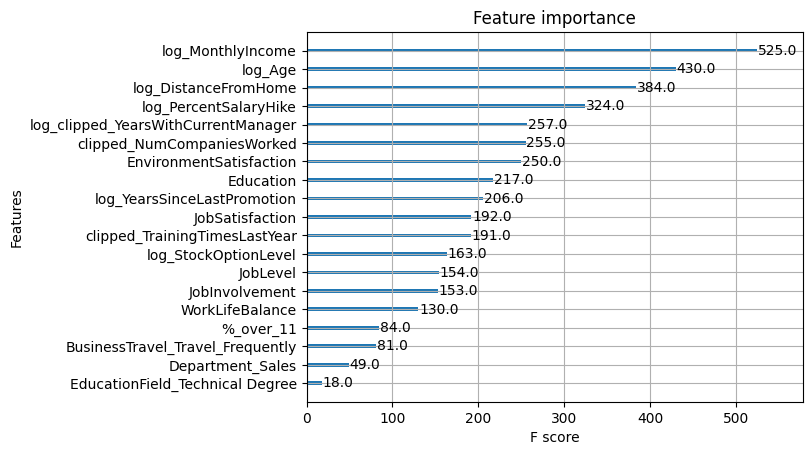

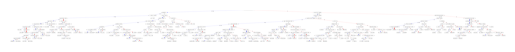

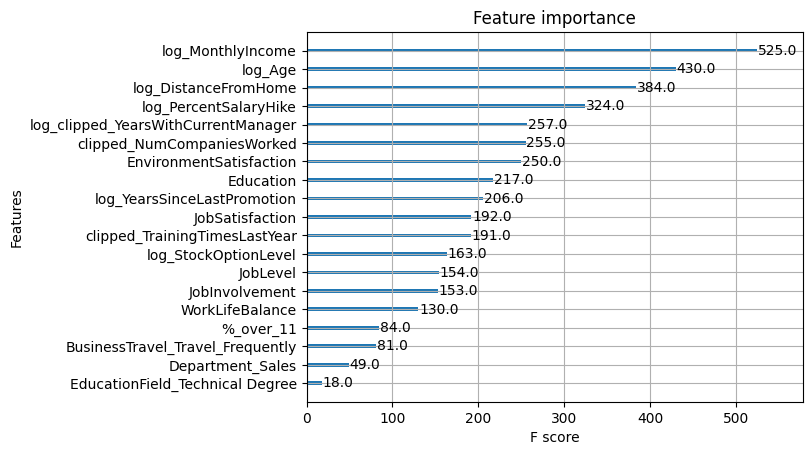

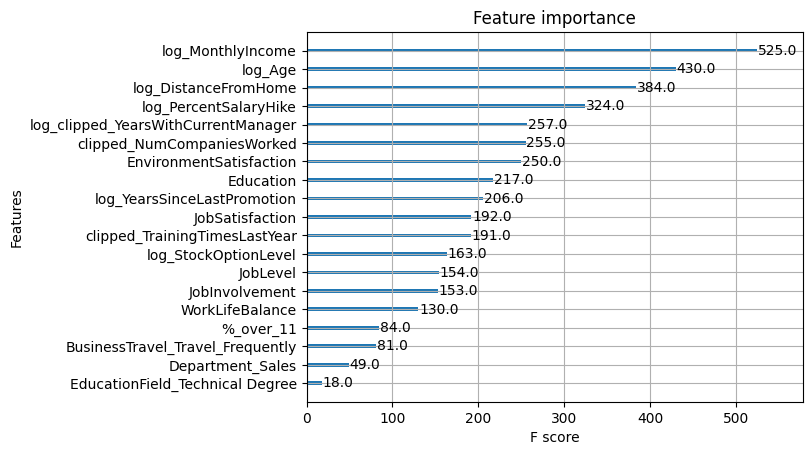

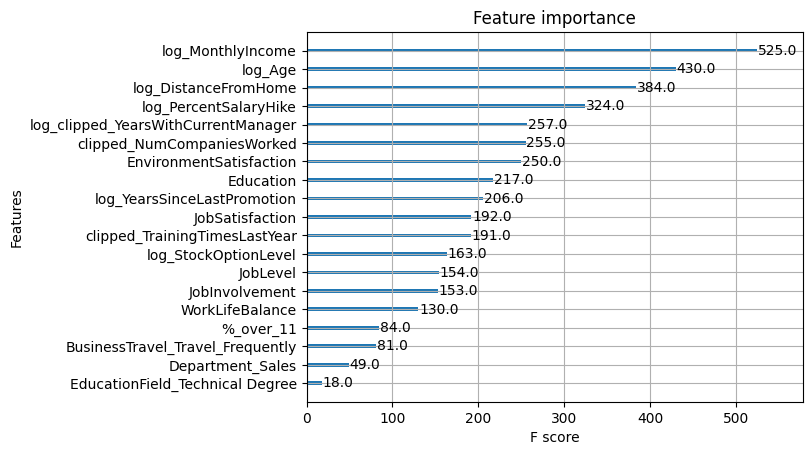

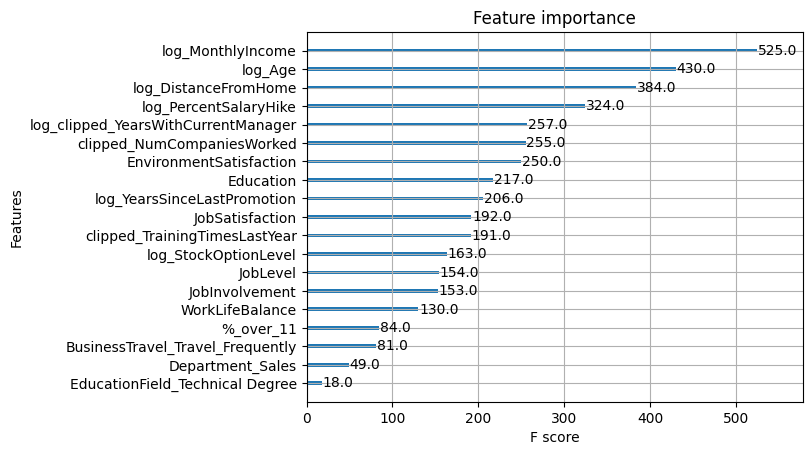

In [ ]:
%matplotlib inline

xgb.plot_importance(xgb_model)

<Axes: >

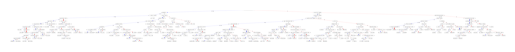

In [ ]:
%matplotlib inline

xgb.plot_tree(xgb_model, num_trees=2)

In [ ]:
## Another modeling attempt to limit features

In [ ]:
cols_to_drop_2 = ['EducationField_Technical Degree', 'Department_Sales', 'BusinessTravel_Travel_Frequently', '%_over_11','WorkLifeBalance', 'JobInvolvement', 'JobLevel', 'log_StockOptionLevel']

model_df_small_2 = model_df_small.drop(columns = cols_to_drop_2)

In [ ]:
# Assign the independent and dependent variables
y_s2 = model_df_small_2['Attrition_Yes']
X_s2 = model_df_small_2.drop(columns = ['Attrition_Yes'])


# partitioning data into 80% train and 20% test, as using CV with xgboost tuning 

X_train_s2, X_test_s2, y_train_s2, y_test_s2 = train_test_split(X_s2, y_s2, test_size = .2, random_state = 1234)


In [ ]:
# Balancing data
# Using SMOTE so we don't lose data and synthetically create new data points
# may still result in overfitting to some degree


smote = SMOTE(sampling_strategy='minority',random_state=0)
X_train_smt_s2, y_train_smt_s2 = smote.fit_resample(X_train_s2, y_train_s2) # X_smt and y_smt will be used in modeling if concerns around balanced data


In [ ]:
# initializing model

xgb_model = xgb.XGBRegressor(objective = "binary:logistic", random_state = 1234)

# setting parameters
params = {
    "gamma": uniform(0, 0.5),
    "learning_rate": uniform(0.03, 0.3), # default 0.1 
    "max_depth": range(2, 6), # default 3; trying to limit depth to enhance interpretability
    "n_estimators": range(50, 300, 50), # default 100; trying to limit to avoid overfitting
}

# using random search to tune
search = RandomizedSearchCV(xgb_model, param_distributions=params, random_state= 1234, n_iter= 25, verbose=1 , return_train_score=True)

search.fit(X_train_smt_s2, y_train_smt_s2)

search.best_estimator_

Fitting 5 folds for each of 25 candidates, totalling 125 fits


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.2840493263130346, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.29073821686836776, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=250, n_jobs=None, num_parallel_tree=None,
             objective='binary:logistic', predictor=None, ...)

In [ ]:
search.cv_results_

{'mean_fit_time': array([1.28794522, 0.46919332, 0.47592864, 1.05060577, 0.54099174,
        0.55433478, 0.53445725, 0.19328551, 1.08892174, 0.88383245,
        0.47294936, 0.85921941, 0.19792295, 0.47213736, 0.55447044,
        0.37609768, 0.86004386, 0.45448656, 0.35519996, 0.19500837,
        0.35907707, 0.45789089, 0.76624155, 1.11981235, 0.18535624]),
 'std_fit_time': array([1.64682559, 0.04507439, 0.02508273, 1.13956626, 0.0457906 ,
        0.04799533, 0.03867102, 0.01535112, 1.03541758, 0.07298843,
        0.03166841, 1.14554901, 0.01518447, 0.03305204, 0.05588059,
        0.02292106, 1.12630318, 0.03486406, 0.03154208, 0.01740586,
        0.02836843, 0.04350829, 1.14478585, 0.07274057, 0.01111306]),
 'mean_score_time': array([0.0072032 , 0.00525851, 0.00546432, 0.00499654, 0.00543628,
        0.00536342, 0.00616937, 0.00395584, 0.00927281, 0.0089592 ,
        0.00494275, 0.00687261, 0.00402379, 0.00497704, 0.00532784,
        0.00536299, 0.00749402, 0.00518012, 0.00568299, 0.00

In [ ]:
search.best_params_

{'gamma': 0.2840493263130346,
 'learning_rate': 0.29073821686836776,
 'max_depth': 4,
 'n_estimators': 250}

In [ ]:
search.best_score_

0.527404595582183

In [ ]:
# initializing XGBoost with optimal parameters

xgb_model = xgb.XGBRegressor(objective = "binary:logistic", gamma = .0404735, learning_rate = .2413633, max_depth = 4, n_estimators = 250, random_state = 1234)

xgb_model.fit(X_train_smt_s2, y_train_smt_s2)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.0404735, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.2413633, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=4,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, n_estimators=250, n_jobs=None,
             num_parallel_tree=None, objective='binary:logistic',
             predictor=None, ...)

In [ ]:
# testing on test set

y_pred_xgb2 = xgb_model.predict(X_test_s2)

# setting predictions to binary value
y_pred_xgb2 = [round(value) for value in y_pred_xgb2]

# Getting confusion Matrix

print(classificationSummary(y_test_s2, y_pred_xgb2))
print(classification_report(y_test_s2, y_pred_xgb2))

Confusion Matrix (Accuracy 0.9898)

       Prediction
Actual   0   1
     0 724   4
     1   5 149
None
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       728
           1       0.97      0.97      0.97       154

    accuracy                           0.99       882
   macro avg       0.98      0.98      0.98       882
weighted avg       0.99      0.99      0.99       882



<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

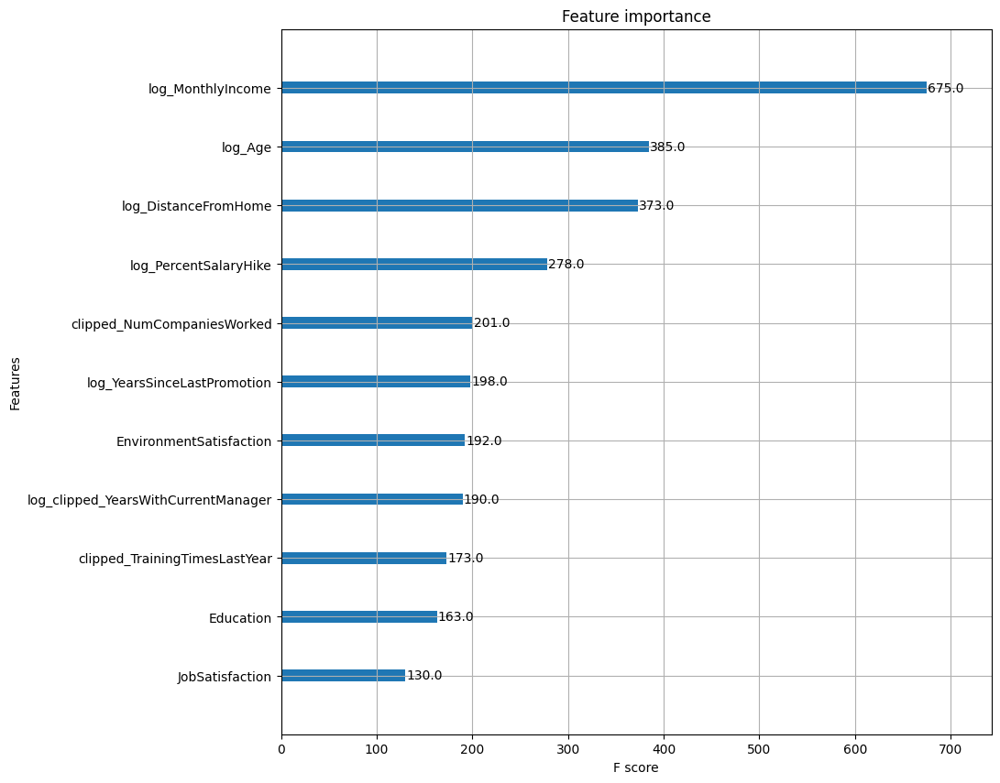

In [ ]:
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 10,10

xgb.plot_importance(xgb_model)

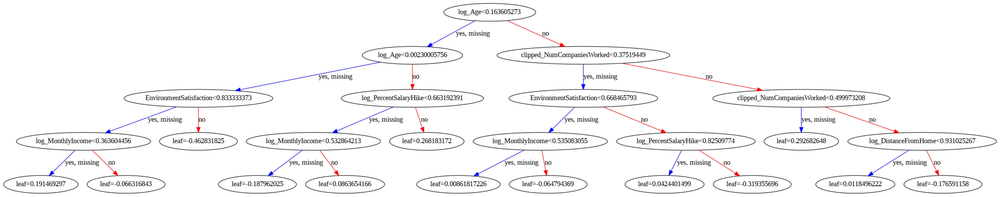

In [ ]:
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 80,50
xgb.plot_tree(xgb_model, num_trees= 50)

plt.show()

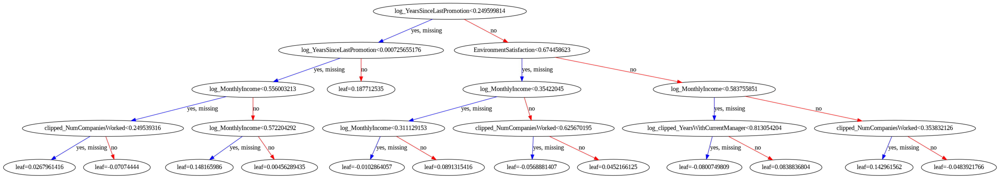

In [ ]:
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 80,50
xgb.plot_tree(xgb_model, num_trees= 201)

plt.show()

In [ ]:


# using on entire data-set to add results to dashboard

y_preds_final = xgb_model.predict(X_s2)

# setting predictions to binary value
y_preds_final = [round(value) for value in y_preds_final]

# Getting confusion Matrix

print(classificationSummary(y_s2, y_preds_final))
print(classification_report(y_s2, y_preds_final))

Confusion Matrix (Accuracy 0.9977)

       Prediction
Actual    0    1
     0 3695    4
     1    6  705
None
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3699
           1       0.99      0.99      0.99       711

    accuracy                           1.00      4410
   macro avg       1.00      1.00      1.00      4410
weighted avg       1.00      1.00      1.00      4410



In [ ]:
model_df_small_2['attrition_prediction'] = y_preds_final 

model_df_small_2['attrition_probability'] = xgb_model.predict(X_s2)

In [ ]:
model_df_small_2.head()

,Attrition_Yes,Education,clipped_NumCompaniesWorked,EnvironmentSatisfaction,JobSatisfaction,clipped_TrainingTimesLastYear,log_Age,log_YearsSinceLastPromotion,log_MonthlyIncome,log_PercentSalaryHike,log_DistanceFromHome,log_clipped_YearsWithCurrentManager,attrition_prediction,attrition_probability
0,0,0.25,0.125,0.666667,1.000000,1.00,0.863147,0.00,0.858755,0.000000,0.462607,0.000000,0,0.002641
1,1,0.00,0.000,0.666667,0.333333,0.50,0.446915,0.25,0.476600,0.896477,0.629511,0.671188,1,0.805841
2,0,0.75,0.125,0.333333,0.333333,0.25,0.473296,0.00,0.988573,0.372072,0.811368,0.578130,0,0.041578
3,0,1.00,0.375,1.000000,1.000000,1.00,0.616513,0.75,0.706394,0.000000,0.149726,0.747222,0,0.001906
4,0,0.00,0.500,1.000000,0.000000,0.25,0.473296,0.00,0.281920,0.103523,0.629511,0.671188,0,0.038741


In [ ]:
final_data = model_df_small_2.loc[model_df_small_2['Attrition_Yes'] == 0]

In [ ]:
final_data.head()

,Attrition_Yes,Education,clipped_NumCompaniesWorked,EnvironmentSatisfaction,JobSatisfaction,clipped_TrainingTimesLastYear,log_Age,log_YearsSinceLastPromotion,log_MonthlyIncome,log_PercentSalaryHike,log_DistanceFromHome,log_clipped_YearsWithCurrentManager,attrition_prediction,attrition_probability
0,0,0.250000,0.125,0.666667,1.000000,1.00,0.863147,0.00,0.858755,0.000000,0.462607,0.000000,0,0.002641
2,0,0.750000,0.125,0.333333,0.333333,0.25,0.473296,0.00,0.988573,0.372072,0.811368,0.578130,0,0.041578
3,0,1.000000,0.375,1.000000,1.000000,1.00,0.616513,0.75,0.706394,0.000000,0.149726,0.747222,0,0.001906
4,0,0.000000,0.500,1.000000,0.000000,0.25,0.473296,0.00,0.281920,0.103523,0.629511,0.671188,0,0.038741
5,0,0.583333,0.375,0.666667,0.333333,1.00,0.776476,0.75,0.467033,0.199370,0.555410,0.867194,0,0.003617


In [ ]:
final_data_ = model_df_small_2

In [ ]:
## Non-transformed Data

# Connect to the database
conn = sqlite3.connect('/content/drive/My Drive/MS-ADS Capstone Project/data/hr_case_study.db')

##### Query general_data table ##### 
# Create cursor object and query table
cursor = conn.cursor()
cursor.execute('SELECT * FROM non_transformed_data AS d')

# Identify the column names for dataframe
col_names = [desc[0] for desc in cursor.description]

# Fetch all rows from the query and store in dataframe
rows = cursor.fetchall()
non_transformed_sql= pd.DataFrame(rows, columns = col_names)

# Close the cursor and connection objects
cursor.close()
conn.close()

In [ ]:
non_transformed_sql['attrition_prediction'] = y_preds_final 

non_transformed_sql['attrition_probability'] = xgb_model.predict(X_s2)

In [ ]:
final_data.to_csv("/content/drive/My Drive/MS-ADS Capstone Project/data/final_features_and_predictions.csv")

non_transformed_sql.to_csv("/content/drive/My Drive/MS-ADS Capstone Project/data/original_data_with_predictions.csv")